Scratch 로 부터 시작하는 Diffusion Model
===============================

- 이 노트북에서 자동차 이미지를 생성하기 위한 간단한 Diffusion model을 만들것입니다.
- 해당 코드들은 아래의 Sources를 참고하여서 만들었습니다.

## Source : 

> Github implementation : https://github.com/lucidrains/denoising-diffusion-pytorch
https://colab.research.google.com/drive/1sjy9odlSSy0RBVgMTgP7s99NXsqglsUL?usp=sharing#scrollTo=HhIgGq3za0yh

>Niels Rogge, Kashif Rasul, Huggingface notebook : https://colab.research.google.com/github/huggingface/notebooks/blob/main/examples/annotated_diffusion.ipynb#scrollTo=c5a94671

>Papers on Diffusion models ([Dhariwal, Nichol, 2021], [Ho et al., 2020] ect.)
https://arxiv.org/abs/2006.11239

## 버전 확인

In [1]:
import torch
import torchvision 

device = "cuda" if torch.cuda.is_available() else "cpu"

In [2]:
from torchvision import datasets 

print("torchvision : ", torchvision.__version__)
print("torch : ", torch.__version__)

torchvision :  0.14.0
torch :  1.13.0


## Investigating the dataset

- 8000개의 이미지로 구성된 StandordCars 데이터 세트를 사용

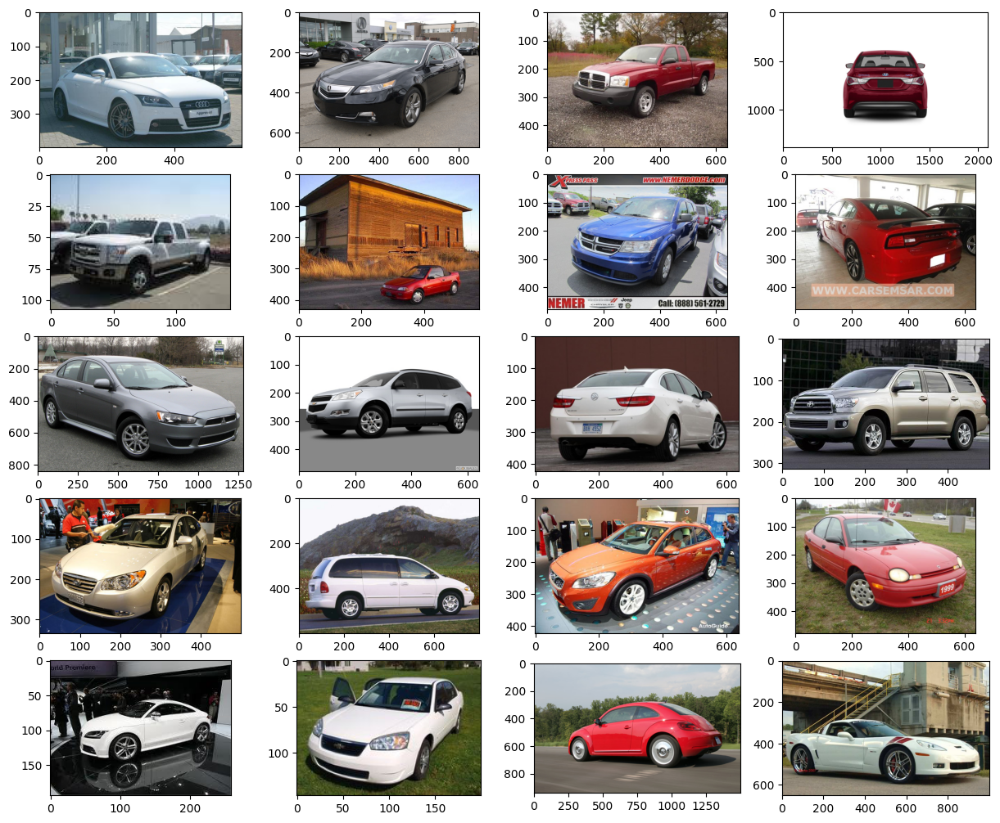

In [3]:
import torch
import torchvision 
import matplotlib.pyplot as plt

def show_images(datset, num_samples=20, cols=4):
    """ Plots some samples from the dataset """
    plt.figure(figsize=(15,15)) 
    for i, img in enumerate(data):
        if i == num_samples:
            break
        plt.subplot(int(num_samples/cols) + 1, cols, i + 1)
        plt.imshow(img[0])

data = torchvision.datasets.StanfordCars(root=".", download=True)
show_images(data)

- 뒷부분에서 우리는 이 데이터 세트를 가지고 몇가지 추가 수정을 수행합니다
- 예를 들어, 이미지를 더 작게 만들고 tensor로 변환하는 작업을 수행합니다.

# Building the Diffusion Model

## Step 1 : The forward process

- 먼저 점점 더 노이즈가 많은 이미지를 모델에 대한 입력으로 빌드해야 합니다. 
- 이 작업을 순차적으로 수행하는 대신 논문에 제공된 닫힌 형식(closed form)을 사용하여 모든 시간 단계에 대한 이미지를 개별적으로 계산할 수 있습니다.

### key takeaways: 
- 노이즈 레벨/분산(variances)은 미리 계산할 수 있습니다. 
- 다양한 유형의 분산 일정(variances schedules)이 있습니다. 
- 각 타임스텝 이미지를 독립적으로 샘플링할 수 있습니다(가우시안 합계도 가우시안입니다). 
- 이런 forward step에는 모델이 필요하지 않습니다.

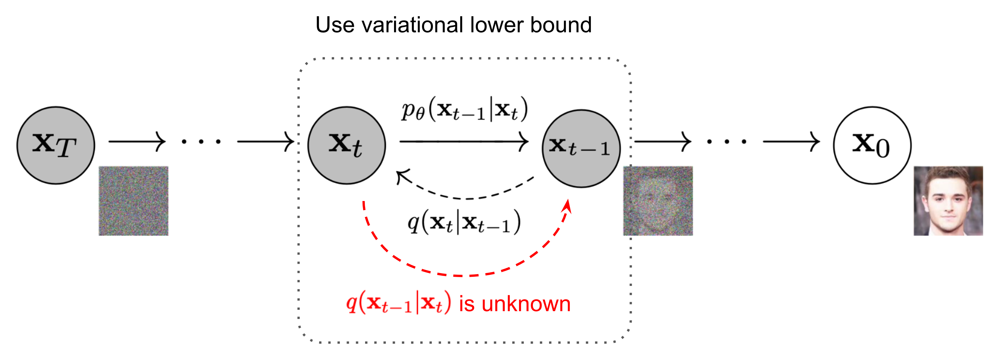

The Markov chain of forward (reverse) diffusion process of generating a sample by slowly adding (removing) noise. (Image source: Ho et al. 2020 with a few additional annotations)

### Forward process : $$ q(\mathbf{x}_t \vert \mathbf{x}_{t-1}) = \mathcal{N}(\mathbf{x}_t; \sqrt{1 - \beta_t} \mathbf{x}_{t-1}, \beta_t\mathbf{I}) \quad
q(\mathbf{x}_{1:T} \vert \mathbf{x}_0) = \prod^T_{t=1} q(\mathbf{x}_t \vert \mathbf{x}_{t-1}) $$
### Closed form : $ \mathbf{x}_t = \sqrt{\bar\alpha_t} \mathbf{x}_0 + \sqrt{(1-\bar{a}_t)}\mathbf{\epsilon}$

>mean = $  \sqrt{\bar\alpha_t} \mathbf{x}_0 $

>variance = $\sqrt{(1-\bar{a}_t)}\mathbf{\epsilon} $

In [4]:
import torch.nn.functional as F

def linear_beta_schedule(timesteps, start=0.0001, end=0.02): #start=0.0001, end=0.02
    return torch.linspace(start, end, timesteps)

In [5]:
# Define beta schedule
T = 300
betas = linear_beta_schedule(timesteps=T)
print(betas[:-5], betas[:5])

tensor([1.0000e-04, 1.6656e-04, 2.3311e-04, 2.9967e-04, 3.6622e-04, 4.3278e-04,
        4.9933e-04, 5.6589e-04, 6.3244e-04, 6.9900e-04, 7.6555e-04, 8.3211e-04,
        8.9866e-04, 9.6522e-04, 1.0318e-03, 1.0983e-03, 1.1649e-03, 1.2314e-03,
        1.2980e-03, 1.3645e-03, 1.4311e-03, 1.4977e-03, 1.5642e-03, 1.6308e-03,
        1.6973e-03, 1.7639e-03, 1.8304e-03, 1.8970e-03, 1.9635e-03, 2.0301e-03,
        2.0967e-03, 2.1632e-03, 2.2298e-03, 2.2963e-03, 2.3629e-03, 2.4294e-03,
        2.4960e-03, 2.5625e-03, 2.6291e-03, 2.6957e-03, 2.7622e-03, 2.8288e-03,
        2.8953e-03, 2.9619e-03, 3.0284e-03, 3.0950e-03, 3.1615e-03, 3.2281e-03,
        3.2946e-03, 3.3612e-03, 3.4278e-03, 3.4943e-03, 3.5609e-03, 3.6274e-03,
        3.6940e-03, 3.7605e-03, 3.8271e-03, 3.8936e-03, 3.9602e-03, 4.0268e-03,
        4.0933e-03, 4.1599e-03, 4.2264e-03, 4.2930e-03, 4.3595e-03, 4.4261e-03,
        4.4926e-03, 4.5592e-03, 4.6258e-03, 4.6923e-03, 4.7589e-03, 4.8254e-03,
        4.8920e-03, 4.9585e-03, 5.0251e-

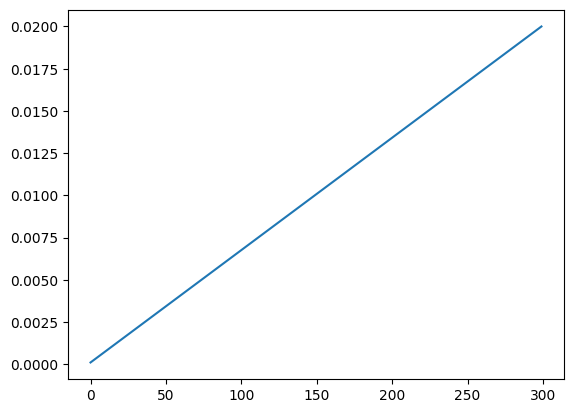

In [6]:
plt.plot(range(300),betas)
plt.show()

- Let $\alpha_t = 1 - \beta_t$ and $\bar{\alpha}_t = \prod_{i=1}^t \alpha_i$

In [7]:
alphas = 1. - betas

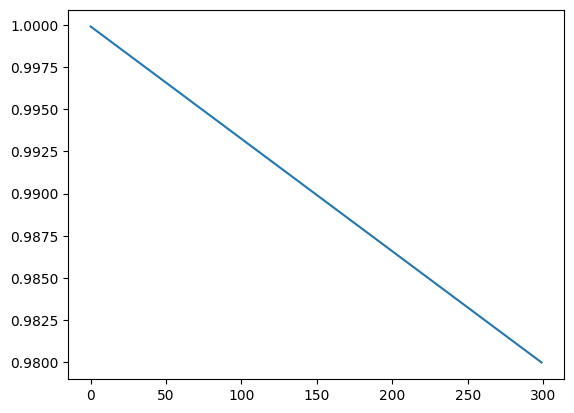

In [8]:
plt.plot(range(300), alphas)
plt.show()

In [9]:
# Pre-calculate different terms for closed form
alphas_cumprod = torch.cumprod(alphas, axis=0) # 누적 nosie alpha
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0) # alpha 이전 값

In [10]:
print(alphas_cumprod[:5])
print(alphas_cumprod_prev[:5])

tensor([0.9999, 0.9997, 0.9995, 0.9992, 0.9988])
tensor([1.0000, 0.9999, 0.9997, 0.9995, 0.9992])


In [11]:
sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)

In [12]:
print(sqrt_recip_alphas[:5])

tensor([1.0000, 1.0001, 1.0001, 1.0001, 1.0002])


In [13]:
# Pre-calculate different terms for closed form
alphas = 1. - betas
alphas_cumprod = torch.cumprod(alphas, axis=0)
alphas_cumprod_prev = F.pad(alphas_cumprod[:-1], (1, 0), value=1.0)

sqrt_recip_alphas = torch.sqrt(1.0 / alphas)
sqrt_alphas_cumprod = torch.sqrt(alphas_cumprod)
sqrt_one_minus_alphas_cumprod = torch.sqrt(1. - alphas_cumprod)

posterior_variance = betas * (1. - alphas_cumprod_prev) / (1. - alphas_cumprod)

- Let's test it on our dataset

In [14]:
def get_index_from_list(vals, t, x_shape):
    """ 
    Returns a specific index t of a passed list of values vals
    while considering the batch dimension.
    
    the batch dimension을 고려하면서 전달된 값 목록 vals의 특정 인덱스 t를 반환합니다.
    """
    batch_size = t.shape[0]
    out = vals.gather(-1, t.cpu())
    return out.reshape(batch_size, *((1,) * (len(x_shape) - 1))).to(t.device)

def forward_diffusion_sample(x_0, t, device="cpu"):
    """ 
    Takes an image and a timestep as input and 
    returns the noisy version of it
    
    iamge랑 timestep을 input으로 받아와서 noisy된 image를 return
    """
    noise = torch.randn_like(x_0)
    sqrt_alphas_cumprod_t = get_index_from_list(sqrt_alphas_cumprod, t, x_0.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x_0.shape
    )
    # mean + variance
    return sqrt_alphas_cumprod_t.to(device) * x_0.to(device) \
    + sqrt_one_minus_alphas_cumprod_t.to(device) * noise.to(device), noise.to(device)

In [15]:
from torchvision import transforms 
from torch.utils.data import DataLoader
import numpy as np

IMG_SIZE = 64
BATCH_SIZE = 128

def load_transformed_dataset():
    data_transforms = [
        transforms.Resize((IMG_SIZE, IMG_SIZE)),
        transforms.RandomHorizontalFlip(),
        transforms.ToTensor(), # Scales data into [0,1] 
        transforms.Lambda(lambda t: (t * 2) - 1) # Scale between [-1, 1] 
    ]
    data_transform = transforms.Compose(data_transforms)

    train = torchvision.datasets.StanfordCars(root=".", download=True, 
                                         transform=data_transform)

    test = torchvision.datasets.StanfordCars(root=".", download=True, 
                                         transform=data_transform, split='test')
    return torch.utils.data.ConcatDataset([train, test])

def show_tensor_image(image):
    reverse_transforms = transforms.Compose([
        transforms.Lambda(lambda t: (t + 1) / 2),
        transforms.Lambda(lambda t: t.permute(1, 2, 0)), # CHW to HWC
        transforms.Lambda(lambda t: t * 255.),
        transforms.Lambda(lambda t: t.numpy().astype(np.uint8)),
        transforms.ToPILImage(),
    ])

    # Take first image of batch
    if len(image.shape) == 4:
        image = image[0, :, :, :] 
    plt.imshow(reverse_transforms(image))

/tmp/ipykernel_32681/1697273805.py:15: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(5, num_images+1, int(idx/stepsize) + 1)


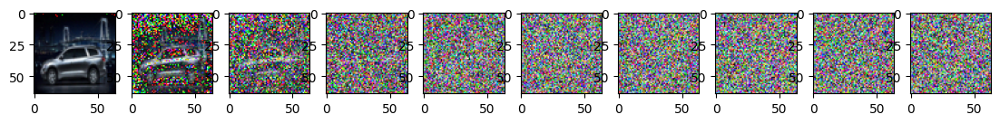

In [16]:
data = load_transformed_dataset()
dataloader = DataLoader(data, batch_size=BATCH_SIZE, shuffle=True, drop_last=True)

# Simulate forward diffusion

image = next(iter(dataloader))[0]

plt.figure(figsize=(15,15))
plt.axis('off')
num_images = 10
stepsize = int(T/num_images)

for idx in range(0, T, stepsize):
    t = torch.Tensor([idx]).type(torch.int64)
    plt.subplot(5, num_images+1, int(idx/stepsize) + 1)
    image, noise = forward_diffusion_sample(image, t)
    show_tensor_image(image)

# Step 2: The backward process = U-Net

### key takeaways: 
- 이미지의 노이즈를 예측하기 위해 간단한 형태의 UNet을 사용합니다.
- 입력은 노이즈 이미지, 출력은 이미지의 노이즈
- parameters는 전체 시간(t)에 걸쳐 공유되기 때문에, 우리는 우리가 어떤 타임스텝에 있는지 네트워크에 알려야 합니다.
- Timestep은 변환기 Sinusoidal Embedding에 의해 인코딩됩니다.
- 분산이 고정되어 있기 때문에 하나의 단일 값(평균)을 출력합니다.

In [17]:
from torch import nn
import math


class Block(nn.Module):
    def __init__(self, in_ch, out_ch, time_emb_dim, up=False):
        super().__init__()
        self.time_mlp =  nn.Linear(time_emb_dim, out_ch)
        if up:
            self.conv1 = nn.Conv2d(2*in_ch, out_ch, 3, padding=1)
            self.transform = nn.ConvTranspose2d(out_ch, out_ch, 4, 2, 1)
        else:
            self.conv1 = nn.Conv2d(in_ch, out_ch, 3, padding=1)
            self.transform = nn.Conv2d(out_ch, out_ch, 4, 2, 1)
        self.conv2 = nn.Conv2d(out_ch, out_ch, 3, padding=1)
        self.bnorm1 = nn.BatchNorm2d(out_ch)
        self.bnorm2 = nn.BatchNorm2d(out_ch)
        self.relu  = nn.ReLU()
        
    def forward(self, x, t, ):
        # First Conv
        h = self.bnorm1(self.relu(self.conv1(x)))
        # Time embedding
        time_emb = self.relu(self.time_mlp(t))
        # Extend last 2 dimensions
        time_emb = time_emb[(..., ) + (None, ) * 2]
        # Add time channel
        h = h + time_emb
        # Second Conv
        h = self.bnorm2(self.relu(self.conv2(h)))
        # Down or Upsample
        return self.transform(h)


class SinusoidalPositionEmbeddings(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.dim = dim

    def forward(self, time):
        device = time.device
        half_dim = self.dim // 2
        embeddings = math.log(10000) / (half_dim - 1)
        embeddings = torch.exp(torch.arange(half_dim, device=device) * -embeddings)
        embeddings = time[:, None] * embeddings[None, :]
        embeddings = torch.cat((embeddings.sin(), embeddings.cos()), dim=-1)
        # TODO: Double check the ordering here
        return embeddings


class SimpleUnet(nn.Module):
    """
    A simplified variant of the Unet architecture.
    """
    def __init__(self):
        super().__init__()
        image_channels = 3
        down_channels = (64, 128, 256, 512, 1024)
        up_channels = (1024, 512, 256, 128, 64)
        out_dim = 1 
        time_emb_dim = 32

        # Time embedding
        self.time_mlp = nn.Sequential(
                SinusoidalPositionEmbeddings(time_emb_dim),
                nn.Linear(time_emb_dim, time_emb_dim),
                nn.ReLU()
            )
        
        # Initial projection
        self.conv0 = nn.Conv2d(image_channels, down_channels[0], 3, padding=1)

        # Downsample
        self.downs = nn.ModuleList([Block(down_channels[i], down_channels[i+1], \
                                    time_emb_dim) \
                    for i in range(len(down_channels)-1)])
        # Upsample
        self.ups = nn.ModuleList([Block(up_channels[i], up_channels[i+1], \
                                        time_emb_dim, up=True) \
                    for i in range(len(up_channels)-1)])

        self.output = nn.Conv2d(up_channels[-1], 3, out_dim)

    def forward(self, x, timestep):
        # Embedd time
        t = self.time_mlp(timestep)
        # Initial conv
        x = self.conv0(x)
        # Unet
        residual_inputs = []
        for down in self.downs:
            x = down(x, t)
            residual_inputs.append(x)
        for up in self.ups:
            residual_x = residual_inputs.pop()
            # Add residual x as additional channels
            x = torch.cat((x, residual_x), dim=1)           
            x = up(x, t)
        return self.output(x)

model = SimpleUnet().to(device)
print("Num params: ", sum(p.numel() for p in model.parameters()))
model

Num params:  62438883


SimpleUnet(
  (time_mlp): Sequential(
    (0): SinusoidalPositionEmbeddings()
    (1): Linear(in_features=32, out_features=32, bias=True)
    (2): ReLU()
  )
  (conv0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (downs): ModuleList(
    (0): Block(
      (time_mlp): Linear(in_features=32, out_features=128, bias=True)
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transform): Conv2d(128, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bnorm1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (bnorm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (1): Block(
      (time_mlp): Linear(in_features=32, out_features=256, bias=True)
      (conv1): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (transfor

**추가적으로 구현할 수 있는 개선 사항:**

- Residual connections
- Different activation functions like SiLU, GWLU, ...
- BatchNormalization
- GroupNormalization
- Attention
...

# Step 3: Loss
    
## Kek Takeaways:

- After some maths we end up with a very simple loss function
- There are other possible choices like L2 loss ect.

In [18]:
def get_loss(model, x_0, t):
    x_noisy, noise = forward_diffusion_sample(x_0, t, device)
    noise_pred = model(x_noisy, t)
    return F.l1_loss(noise, noise_pred)

# Sampleing

모델을 호출하여 이미지의 노이즈를 예측하고 노이즈가 제거된 이미지를 반환합니다.

아직 마지막 단계에 있지 않은 경우 이 이미지에 노이즈를 적용합니다.

In [19]:
@torch.no_grad()
def sample_timestep(x, t):
    """
    Calls the model to predict the noise in the image and returns 
    the denoised image. 
    Applies noise to this image, if we are not in the last step yet.
    """
    betas_t = get_index_from_list(betas, t, x.shape)
    sqrt_one_minus_alphas_cumprod_t = get_index_from_list(
        sqrt_one_minus_alphas_cumprod, t, x.shape
    )
    sqrt_recip_alphas_t = get_index_from_list(sqrt_recip_alphas, t, x.shape)
    
    # Call model (current image - noise prediction)
    model_mean = sqrt_recip_alphas_t * (
        x - betas_t * model(x, t) / sqrt_one_minus_alphas_cumprod_t
    )
    posterior_variance_t = get_index_from_list(posterior_variance, t, x.shape)
    
    if t == 0:
        return model_mean
    else:
        noise = torch.randn_like(x)
        return model_mean + torch.sqrt(posterior_variance_t) * noise 

In [20]:
image = next(iter(dataloader))[0]

/tmp/ipykernel_32681/2120245564.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(5, 1, 1)


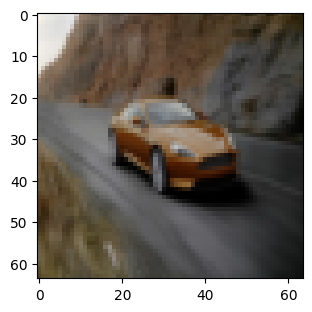

In [21]:
plt.figure(figsize=(20,20))
plt.axis('off')
plt.subplot(5, 1, 1)
show_tensor_image(image)

In [22]:
i = 10
t = torch.full((1,), i, device=device)

In [23]:
print(t, i)
print(type(t), type(i))
print(type(image))

tensor([10], device='cuda:0') 10
<class 'torch.Tensor'> <class 'int'>
<class 'torch.Tensor'>


In [24]:
print([i for i in range(0,T)[::-1]])

[299, 298, 297, 296, 295, 294, 293, 292, 291, 290, 289, 288, 287, 286, 285, 284, 283, 282, 281, 280, 279, 278, 277, 276, 275, 274, 273, 272, 271, 270, 269, 268, 267, 266, 265, 264, 263, 262, 261, 260, 259, 258, 257, 256, 255, 254, 253, 252, 251, 250, 249, 248, 247, 246, 245, 244, 243, 242, 241, 240, 239, 238, 237, 236, 235, 234, 233, 232, 231, 230, 229, 228, 227, 226, 225, 224, 223, 222, 221, 220, 219, 218, 217, 216, 215, 214, 213, 212, 211, 210, 209, 208, 207, 206, 205, 204, 203, 202, 201, 200, 199, 198, 197, 196, 195, 194, 193, 192, 191, 190, 189, 188, 187, 186, 185, 184, 183, 182, 181, 180, 179, 178, 177, 176, 175, 174, 173, 172, 171, 170, 169, 168, 167, 166, 165, 164, 163, 162, 161, 160, 159, 158, 157, 156, 155, 154, 153, 152, 151, 150, 149, 148, 147, 146, 145, 144, 143, 142, 141, 140, 139, 138, 137, 136, 135, 134, 133, 132, 131, 130, 129, 128, 127, 126, 125, 124, 123, 122, 121, 120, 119, 118, 117, 116, 115, 114, 113, 112, 111, 110, 109, 108, 107, 106, 105, 104, 103, 102, 101, 100,

In [25]:
i = 290
t = torch.full((1,), i, device=device)

image = image.to(device)
output_images = sample_timestep(image, t)

/tmp/ipykernel_32681/4143483097.py:3: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(5, 1, 1)


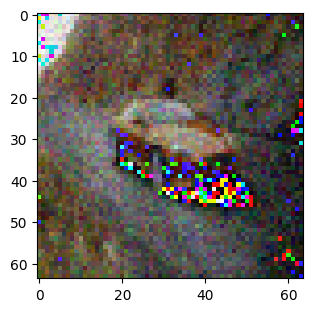

In [26]:
plt.figure(figsize=(20,20))
plt.axis('off')
plt.subplot(5, 1, 1)
show_tensor_image(output_images.to("cpu"))

In [27]:
@torch.no_grad()
def sample_plot_image():
    # Sample noise
    img_size = IMG_SIZE
    img = torch.randn((1, 3, img_size, img_size), device=device)
    plt.figure(figsize=(15,15))
    plt.axis('off')
    num_images = 10
    stepsize = int(T/num_images)

    for i in range(0,T)[::-1]:
        t = torch.full((1,), i, device=device, dtype=torch.long)
        img = sample_timestep(img, t)
        if i % stepsize == 0:
            plt.subplot(1, num_images, int(i/stepsize)+1)
            show_tensor_image(img.detach().cpu())
    plt.show()            

# Trainin

Epoch 0 | step 000 Loss: 0.811103343963623 


/tmp/ipykernel_32681/394547525.py:15: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  plt.subplot(1, num_images, int(i/stepsize)+1)


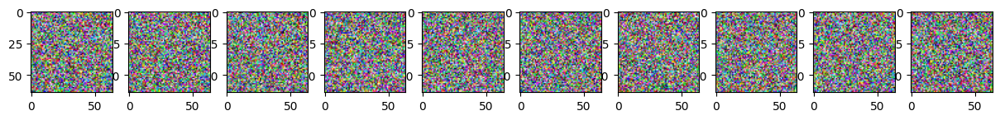

Epoch 5 | step 000 Loss: 0.28455328941345215 


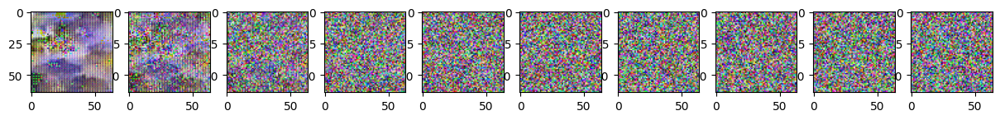

Epoch 10 | step 000 Loss: 0.15454815328121185 


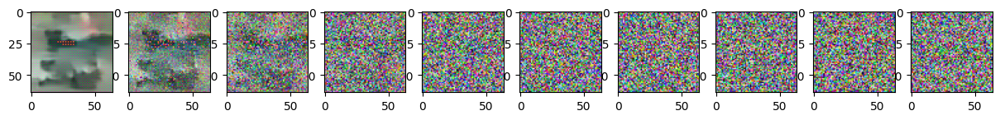

Epoch 15 | step 000 Loss: 0.15665191411972046 


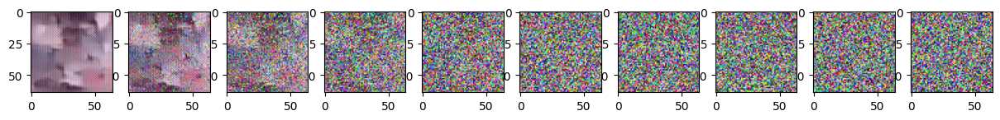

Epoch 20 | step 000 Loss: 0.15139049291610718 


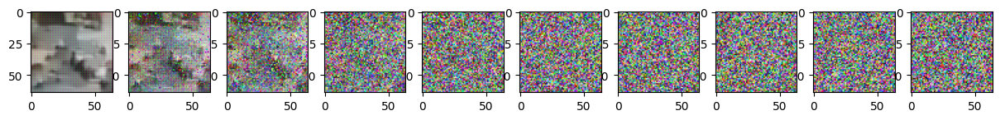

Epoch 25 | step 000 Loss: 0.1448768824338913 


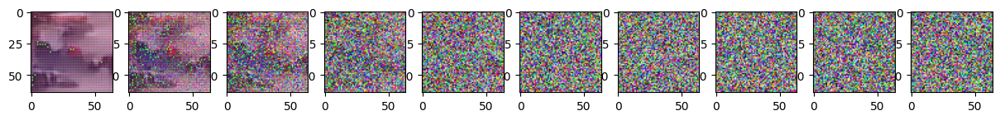

Epoch 30 | step 000 Loss: 0.14466923475265503 


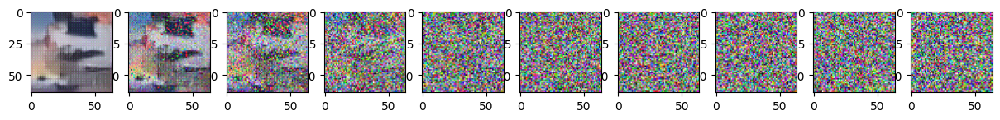

Epoch 35 | step 000 Loss: 0.15927152335643768 


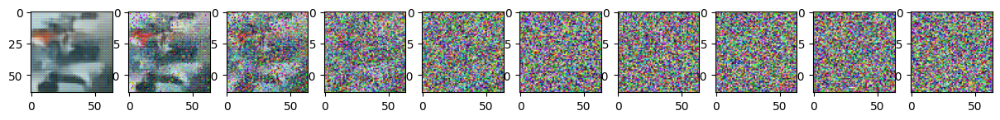

Epoch 40 | step 000 Loss: 0.13295947015285492 


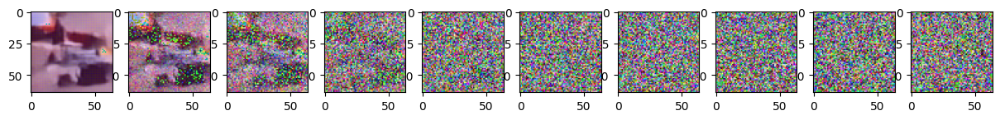

Epoch 45 | step 000 Loss: 0.1399485319852829 


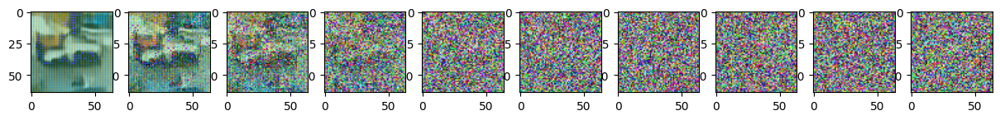

Epoch 50 | step 000 Loss: 0.13191966712474823 


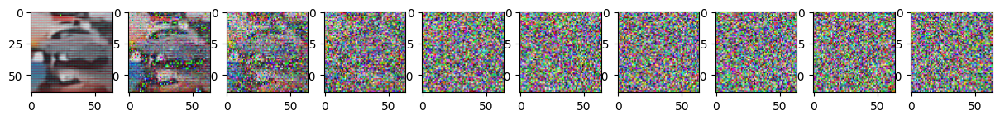

Epoch 55 | step 000 Loss: 0.13051700592041016 


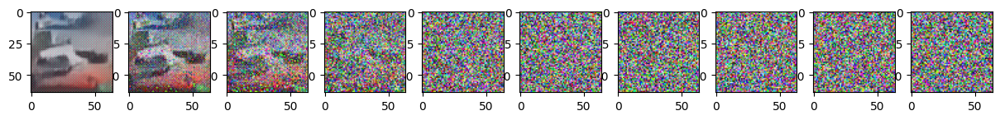

Epoch 60 | step 000 Loss: 0.1391492784023285 


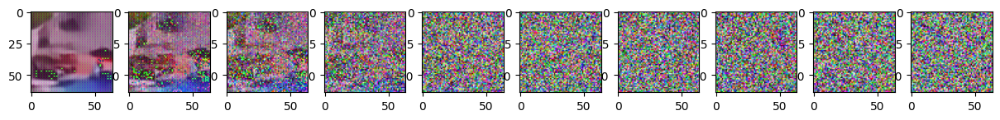

Epoch 65 | step 000 Loss: 0.13973459601402283 


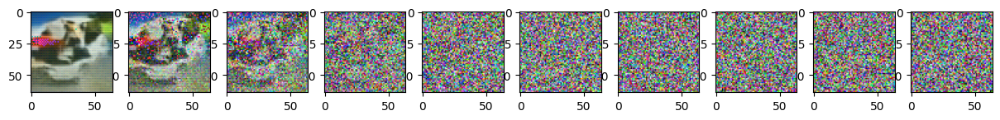

Epoch 70 | step 000 Loss: 0.11539562046527863 


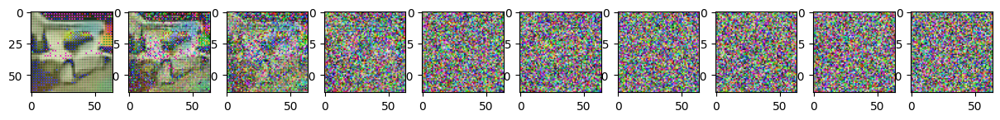

Epoch 75 | step 000 Loss: 0.1462228000164032 


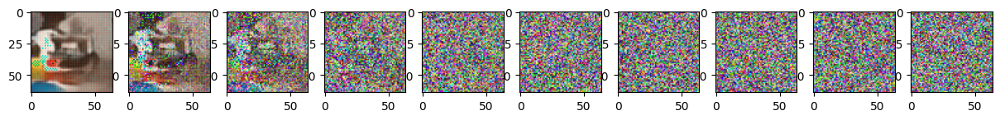

Epoch 80 | step 000 Loss: 0.12865522503852844 


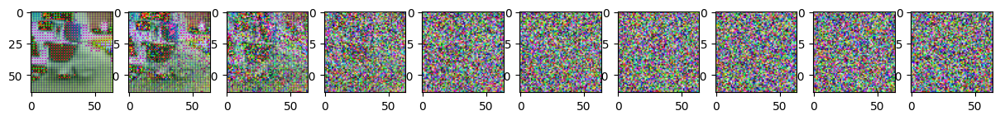

Epoch 85 | step 000 Loss: 0.12698940932750702 


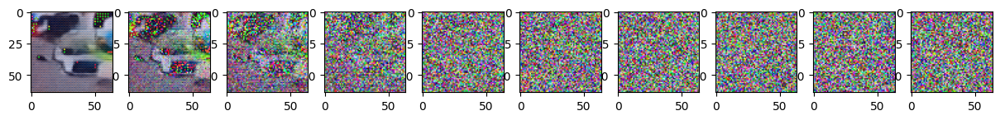

Epoch 90 | step 000 Loss: 0.12756851315498352 


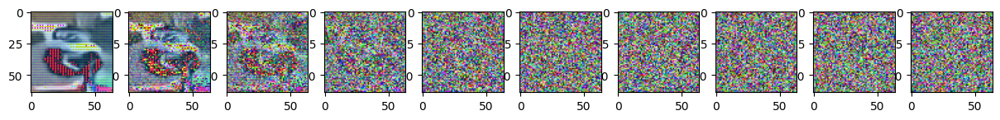

Epoch 95 | step 000 Loss: 0.13038867712020874 


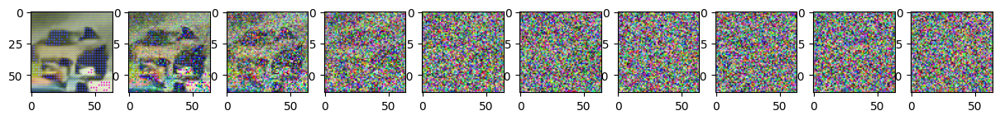

In [28]:
from torch.optim import Adam

model.to(device)
optimizer = Adam(model.parameters(), lr=0.001)
epochs = 100 # Try more!

for epoch in range(epochs):
    for step, batch in enumerate(dataloader):
        optimizer.zero_grad()

        t = torch.randint(0, T, (BATCH_SIZE,), device=device).long()
        loss = get_loss(model, batch[0], t)
        loss.backward()
        optimizer.step()

        if epoch % 5 == 0 and step == 0:
            print(f"Epoch {epoch} | step {step:03d} Loss: {loss.item()} ")
            sample_plot_image()